In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import os
import sys
import scipy
import matplotlib
from matplotlib import rcParams
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all" # to show output from all the lines in a cells
pd.set_option('display.max_column',None) # display all the columns in pandas
pd.options.display.max_rows = 100
rcParams['pdf.fonttype'] = 42
sc.settings.figdir = './figures/figure4_S7/'
sc.settings.set_figure_params(dpi = 150, color_map = 'RdPu', dpi_save = 600, vector_friendly = True, format = 'pdf')

In [2]:
cd F:\PROJECTS\PROJECT_HUMAN_FETAL_COCHLEAE\WORKPLACE\R\sc_pipeline\

F:\PROJECTS\PROJECT_HUMAN_FETAL_COCHLEAE\WORKPLACE\R\sc_pipeline


G:\Miniconda3\envs\omicverse\lib\site-packages\IPython\core\magics\osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [3]:
data_dir = '/PROJECTS/PROJECT_HUMAN_FETAL_COCHLEAE/WORKPLACE/R/sc_pipeline/'
meta = pd.read_csv(data_dir+'metadata.csv',index_col=0)
meta

,sample_id,donor,gw,gender,10xKit,sequencing,dataset,species
sample,,,,,,,,
9.5gw,gw9,not_provided_1,9,female,SC3,snRNA-seq,public,Homo sapiens
11.2gw,gw11,not_provided_2,11,male,SC3,snRNA-seq,public,Homo sapiens
14+3gw,gw14,F20240701,14,male,SC3,snRNA-seq,in-house,Homo sapiens
15gw,gw15,not_provided_3,15,female,SC3,scRNA-seq,public,Homo sapiens
16+4gw,gw16,F20241018,16,male,SC3,snRNA-seq,in-house,Homo sapiens
17+2gw,gw17_1,F20220807,17,male,SC3,snRNA-seq,in-house,Homo sapiens
17+3gw,gw17_2,F20240928,17,female,SC3,snRNA-seq,in-house,Homo sapiens
17gw,gw17_3,not_provided_4,17,male,SC3,scRNA-seq,public,Homo sapiens
18+3gw,gw18,F20220806,18,male,SC3,snRNA-seq,in-house,Homo sapiens


In [4]:
adata_sgn=sc.read('human_sgn_scANVI_integration_v2.h5ad')

### FIGURE S7a/d
#### generate in R slingshot analysis

### FIGURE S7b/c

maxp pruned
LTSH dropped
cmap pruned
kern dropped
post pruned
PCLT dropped
JSTF dropped
meta dropped
DSIG dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 52 glyphs before
Glyph names: ['.notdef', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'U', 'X', 'Y', 'a', 'c', 'd', 'e', 'eight', 'f', 'four', 'g', 'glyph00001', 'glyph00002', 'i', 'l', 'm', 'n', 'one', 'p', 'plus', 'r', 's', 'six', 'slash', 'space', 't', 'three', 'two', 'u', 'underscore', 'v', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 14, 18, 19, 20, 21, 22, 23, 25, 27, 36, 37, 38, 39, 40, 41, 42, 43, 44, 46, 47, 48, 49, 50, 51, 53, 54, 55, 56, 59, 60, 66, 68, 70, 71, 72, 73, 74, 76, 79, 80, 81, 83, 85, 86, 87, 88, 89, 92]
Closed glyph list over 'GSUB': 68 glyphs after
Glyph names: ['.notdef', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'U', 'X', 'Y', 'a', 'c', 'd'

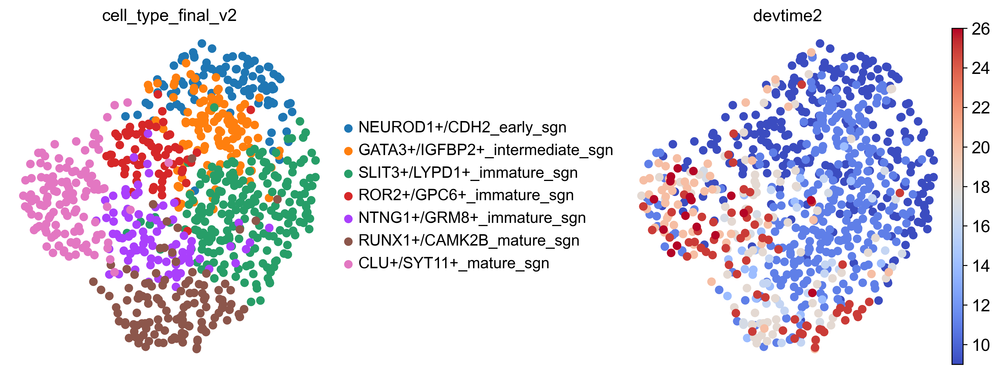

In [17]:
sc.set_figure_params(figsize=(4,5),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(adata_sgn, 
           color=['cell_type_final_v2', 'devtime2'], 
           size=200, 
           wspace=0.75, 
           ncols=2, save='_human_sgn.pdf',
           color_map="coolwarm", 
           )

In [6]:
palette2={
             "SLIT3+/LYPD1+_immature_sgn": "#62edd0",
              "CLU+/SYT11+_mature_sgn": "#575add",
              "RUNX1+/CAMK2B_mature_sgn": "#e8ba69",
              "GATA3+/IGFBP2+_intermediate_sgn": "#74c5e9",
              "NEUROD1+/CDH2_early_sgn": "#1db342",
              "NTNG1+/GRM8+_immature_sgn": "#9b5792",
              "ROR2+/GPC6+_immature_sgn": "#b7de27",
            
            }

In [7]:
adata=adata_sgn.copy()
sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)

In [8]:
sc.pp.highly_variable_genes(adata, flavor='seurat_v3', n_top_genes=2000, subset=True)

G:\Miniconda3\envs\omicverse\lib\site-packages\legacy_api_wrap\__init__.py:88: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  return fn(*args_all, **kw)


In [9]:
import sctour as sct

In [11]:
adata.X = adata.X.toarray() 

tnode = sct.train.Trainer(adata, loss_mode='mse', alpha_recon_lec=0.5, alpha_recon_lode=0.5)
tnode.train()

Running using GPU.
Epoch 400: 100%|██████████| 400/400 [02:17<00:00,  2.92epoch/s, train_loss=285, val_loss=330]


In [12]:
adata.obs['ptime'] = tnode.get_time()

In [13]:
#zs represents the latent z from variational inference, and pred_zs represents the latent z from ODE solver
#mix_zs represents the weighted combination of the two, which is used for downstream analysis
mix_zs, zs, pred_zs = tnode.get_latentsp(alpha_z=0.5, alpha_predz=0.5)
adata.obsm['X_TNODE'] = mix_zs

In [14]:
adata.obsm['X_VF'] = tnode.get_vector_field(adata.obs['ptime'].values, adata.obsm['X_TNODE'])

In [20]:
fig, axs = plt.subplots(ncols=2, nrows=2, figsize=(10, 10))
sc.pl.umap(adata, color='cell_type_final_v2', ax=axs[0, 0], palette=palette2,
           legend_loc='on data', show=False, frameon=False)
sc.pl.umap(adata, color='batch', ax=axs[0, 1], show=False, frameon=False)
sc.pl.umap(adata, color='ptime', ax=axs[1, 0], show=False, frameon=False)
sct.vf.plot_vector_field(adata, zs_key='X_TNODE', vf_key='X_VF', use_rep_neigh='X_TNODE', color='cell_type_final_v2', 
                         show=False, ax=axs[1, 1], legend_loc='none', frameon=False, size=100, alpha=0.4,
                        save=data_dir+'figures/figure4_S7/human_sgn_sctour_revision2.pdf')
plt.show()

<Axes: title={'center': 'cell_type_final_v2'}, xlabel='UMAP1', ylabel='UMAP2'>

<Axes: title={'center': 'batch'}, xlabel='UMAP1', ylabel='UMAP2'>

<Axes: title={'center': 'ptime'}, xlabel='UMAP1', ylabel='UMAP2'>

maxp pruned
LTSH dropped
cmap pruned
kern dropped
post pruned
PCLT dropped
JSTF dropped
meta dropped
DSIG dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 33 glyphs before
Glyph names: ['.notdef', 'G', 'W', 'a', 'b', 'c', 'e', 'eight', 'f', 'five', 'four', 'g', 'glyph00001', 'glyph00002', 'h', 'i', 'l', 'm', 'n', 'nine', 'one', 'p', 'period', 'seven', 'six', 'space', 't', 'two', 'underscore', 'v', 'w', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 23, 24, 25, 26, 27, 28, 42, 58, 66, 68, 69, 70, 72, 73, 74, 75, 76, 79, 80, 81, 83, 87, 89, 90, 92]
Closed glyph list over 'GSUB': 52 glyphs after
Glyph names: ['.notdef', 'G', 'W', 'a', 'b', 'c', 'e', 'eight', 'f', 'five', 'four', 'g', 'glyph00001', 'glyph00002', 'glyph03464', 'glyph03674', 'glyph03675', 'glyph03676', 'glyph03678', 'glyph03679', 'glyph03680', 'glyph03681', 'glyph03682', 'glyph03683', 'h', 'i', 'l', 'm', 'n', 'nine', 'one', 'p', 'period

### FIGURE S7e-f

#### pySCENIC ANALYSIS VERSION 2

In [21]:
from sklearn.utils import resample
max_cells = 100

# 创建一个空列表存储要保留的细胞索引
cells_to_keep = []

# 对每个cluster进行降采样
for cluster in adata_sgn.obs['cell_type_final_v2'].unique():
    # 获取当前cluster的所有细胞索引
    cluster_cells = adata_sgn.obs[adata_sgn.obs['cell_type_final_v2'] == cluster].index
    
    # 如果细胞数超过阈值，则随机采样
    if len(cluster_cells) > max_cells:
        sampled_cells = resample(cluster_cells, 
                               replace=False, 
                               n_samples=max_cells, 
                               random_state=42)
        cells_to_keep.extend(sampled_cells)
    else:
        cells_to_keep.extend(cluster_cells)

# 创建降采样后的AnnData对象
downsampled_adata = adata_sgn[cells_to_keep, :].copy()
downsampled_adata

AnnData object with n_obs × n_vars = 645 × 24804
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'leiden_R', 'cell_type', 'doublet_score', 'predicted_doublet', 'leiden_0.8', 'leiden_0.4', 'cell_type_final', 'scVI_res_1', 'scANVI_res2.0', 'scANVI_res0.8', 'scANVI_res1.0', 'devtime', 'devtime2', 'cell_type_final_v2'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'cell_type_final_v2_colors', 'devtime_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'scANVI_res0.8', 'scANVI_res0.8_colors', 'scANVI_res1.0', 'scANVI_res1.0_colors', 'scANVI_res2.0', 'scVI_res_1', 'scVI_res_1_colors', 'umap'
    obsm: 'X_harmony', 'X_pca', 'X_scANVI', 'X_scVI', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [22]:
import loompy as lp
import pandas as pd

In [ ]:
f_loom_path_scenic = "merged_downsample_scenic_human_sgn.loom"
# create basic row and column attributes for the loom file:
row_attrs = {
    "Gene": np.array(downsampled_adata.var_names) ,
}
col_attrs = {
    "CellID": np.array(downsampled_adata.obs_names) ,
    "nGene": np.array( np.sum(downsampled_adata.X.transpose()>0 , axis=0)).flatten() ,
    "nUMI": np.array( np.sum(downsampled_adata.X.transpose() , axis=0)).flatten() ,
}
lp.create( f_loom_path_scenic, downsampled_adata.X.transpose(), row_attrs, col_attrs)

In [ ]:
downsampled_adata = adata_sgn[cells_to_keep, :].copy()

if downsampled_adata.raw is not None:
    downsampled_adata.raw.var = downsampled_adata.raw.var.rename(columns={'_index': 'features'})

downsampled_adata.var = downsampled_adata.var.rename(columns={'_index': 'features'})
downsampled_adata.write_h5ad('merged_downsampled_human_sgn.h5ad')

#### RUN in LINUX system

In [ ]:
conda activate pyscenic
cd /mnt/f/PROJECTS
cd ./PROJECT_HUMAN_FETAL_COCHLEAE/
cd ./WORKPLACE/R/sc_pipeline
f_loom_path_scenic="merged_downsample_scenic_human_sgn.loom"
f_tfs="allTFs_hg38.txt"
arboreto_with_multiprocessing.py \
    $f_loom_path_scenic \
    $f_tfs \
    --method grnboost2 \
    --output adj_HUMAN_SGN.tsv \
    --num_workers 40 \
    --seed 777

In [ ]:
# 命令行运行
conda activate pyscenic
cd /mnt/f/PROJECTS
cd ./PROJECT_HUMAN_FETAL_COCHLEAE/
cd ./WORKPLACE/R/sc_pipeline
#f_motif_path="motifs-v10nr_clust-nr.hgnc-m0.001-o0.0.tbl"
f_motif_path="motifs-v9-nr.hgnc-m0.001-o0.0.tbl"
f_loom_path_scenic="merged_downsample_scenic_human_sgn.loom"
pyscenic ctx adj_HUMAN_SGN.tsv \
    hg38__refseq-r80__10kb_up_and_down_tss.mc9nr.genes_vs_motifs.rankings.feather \
    hg38__refseq-r80__500bp_up_and_100bp_down_tss.mc9nr.genes_vs_motifs.rankings.feather \
    hg38_10kbp_up_10kbp_down_full_tx_v10_clust.genes_vs_motifs.rankings.feather \
    hg38_10kbp_up_10kbp_down_full_tx_v10_clust.genes_vs_motifs.scores.feather \
    hg38_500bp_up_100bp_down_full_tx_v10_clust.genes_vs_motifs.rankings.feather \
    hg38_500bp_up_100bp_down_full_tx_v10_clust.genes_vs_motifs.scores.feather \
    --annotations_fname $f_motif_path \
    --expression_mtx_fname $f_loom_path_scenic \
    --output reg_HUMAN_SGN_v2.csv \
    --mask_dropouts \
    --num_workers 40

In [ ]:
conda activate pyscenic
cd /mnt/f/PROJECTS
cd ./PROJECT_HUMAN_FETAL_COCHLEAE/
cd ./WORKPLACE/R/sc_pipeline
f_motif_path="motifs-v9-nr.hgnc-m0.001-o0.0.tbl"
f_loom_path_scenic="merged_downsample_scenic_human_sgn.loom"
pyscenic aucell \
    $f_loom_path_scenic \
    reg_HUMAN_SGN_v2.csv \
    --output aucell_results_HUMAN_SGN_v2.loom \
    --num_workers 40

##### Regulon visualization

In [23]:
downsampled_adata = sc.read_h5ad('merged_downsampled_human_sgn.h5ad')
downsampled_adata

AnnData object with n_obs × n_vars = 645 × 24804
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'leiden_R', 'cell_type', 'doublet_score', 'predicted_doublet', 'leiden_0.8', 'leiden_0.4', 'cell_type_final', 'scVI_res_1', 'scANVI_res2.0', 'scANVI_res0.8', 'scANVI_res1.0', 'devtime', 'devtime2', 'cell_type_final_v2'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'cell_type_final_v2_colors', 'devtime_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'scANVI_res0.8', 'scANVI_res0.8_colors', 'scANVI_res1.0', 'scANVI_res1.0_colors', 'scANVI_res2.0', 'scVI_res_1', 'scVI_res_1_colors', 'umap'
    obsm: 'X_harmony', 'X_pca', 'X_scANVI', 'X_scVI', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [24]:
import json
import zlib
import base64
import pandas as pd

# collect SCENIC AUCell output
f_pyscenic_output = 'aucell_results_HUMAN_SGN.loom'
lf = lp.connect( f_pyscenic_output, mode='r+', validate=False )
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)
lf.close()
auc_mtx

,ALX3(+),ALX4(+),ARID3A(+),ATF1(+),ATF2(+),ATF3(+),ATF4(+),ATF6B(+),BACH1(+),BACH2(+),BARHL1(+),BCL11A(+),BCL11B(+),BCL6(+),BCLAF1(+),BHLHE40(+),BHLHE41(+),BPTF(+),CBFB(+),CEBPA(+),CEBPB(+),CEBPD(+),CEBPG(+),CEBPZ(+),CERS4(+),CHURC1(+),CLOCK(+),CREB3L1(+),CREB5(+),CUX2(+),DBP(+),DLX5(+),DLX6(+),DNMT1(+),E2F3(+),E2F6(+),E4F1(+),EBF2(+),EGR1(+),EGR2(+),ELF1(+),ELF2(+),ELF3(+),ELF4(+),ELK3(+),ELK4(+),EP300(+),EPAS1(+),ERF(+),ERG(+),ESRRA(+),ETS1(+),ETS2(+),ETV1(+),ETV5(+),ETV6(+),ETV7(+),FLI1(+),FOS(+),FOSL2(+),FOXC1(+),FOXC2(+),FOXD1(+),FOXJ2(+),FOXJ3(+),FOXK1(+),FOXL1(+),FOXO1(+),FOXO3(+),FOXO6(+),FOXP4(+),GABPA(+),GABPB1(+),GATA2(+),GATA3(+),GLI2(+),GLIS2(+),GMEB1(+),GPBP1L1(+),GRHL2(+),GTF2A2(+),GTF2IRD1(+),GTF3C2(+),HDAC2(+),HDX(+),HES1(+),HES2(+),HES5(+),HES7(+),HEY1(+),HEY2(+),HIC1(+),HLTF(+),HMBOX1(+),HMGA2(+),HNF4G(+),HOMEZ(+),HOXB2(+),HSF1(+),HSF2(+),IKZF2(+),IKZF5(+),ILF2(+),ILF3(+),ING4(+),IRF1(+),IRF2(+),IRF3(+),IRF6(+),IRF7(+),IRF9(+),ISL1(+),JDP2(+),JUN(+),JUNB(+),JUND(+),KLF10(+),KLF13(+),KLF16(+),KLF3(+),KLF4(+),KLF6(+),KLF9(+),LCORL(+),LEF1(+),LMX1A(+),MAF(+),MAFA(+),MAFB(+),MAFF(+),MAFK(+),MAZ(+),MEF2D(+),MEIS1(+),MEIS2(+),MITF(+),MNT(+),MNX1(+),MSC(+),MSX1(+),MTF1(+),MTF2(+),MXD4(+),MXI1(+),MYBL1(+),MYC(+),MYOG(+),MZF1(+),NEUROD1(+),NFATC1(+),NFATC2(+),NFATC3(+),NFE2L1(+),NFE2L2(+),NFIA(+),NFIB(+),NFIC(+),NFKB2(+),NFXL1(+),NFYA(+),NFYC(+),NHLH1(+),NKX3-2(+),NKX6-1(+),NR1D2(+),NR2C1(+),NR2C2(+),NR2F1(+),NR2F2(+),NR2F6(+),NR3C1(+),ONECUT1(+),ONECUT2(+),ONECUT3(+),OSR1(+),OVOL2(+),PATZ1(+),PAX1(+),PAX6(+),PAX9(+),PBX1(+),PBX2(+),PBX4(+),PKNOX2(+),PLAG1(+),PML(+),POU2F1(+),POU2F2(+),POU2F3(+),POU3F1(+),POU3F2(+),POU4F1(+),POU5F1B(+),POU6F2(+),PPARG(+),PRDM16(+),PRDM6(+),PRRX2(+),PURA(+),RARA(+),RARG(+),REL(+),RELB(+),REST(+),RFX1(+),RFX2(+),RFXANK(+),RFXAP(+),RNF114(+),RORB(+),RREB1(+),RUNX1(+),RUNX2(+),RUNX3(+),RXRA(+),RXRB(+),RXRG(+),SALL4(+),SIX2(+),SIX5(+),SMAD1(+),SMAD2(+),SMAD3(+),SMAD5(+),SMAD9(+),SMC3(+),SOX11(+),SOX12(+),SOX13(+),SOX17(+),SOX18(+),SOX5(+),SOX6(+),SOX7(+),SOX8(+),SOX9(+),SP1(+),SP5(+),SPI1(+),SREBF1(+),SREBF2(+),STAT1(+),STAT2(+),STAT3(+),STAT4(+),STAT5A(+),TAF1(+),TAL1(+),TBR1(+),TBX1(+),TBX18(+),TBX2(+),TCF12(+),TCF3(+),TCF7L1(+),TCF7L2(+),TEAD1(+),TEAD4(+),TEF(+),TFAP2A(+),TFCP2(+),TFCP2L1(+),TFDP2(+),TFEB(+),TGIF1(+),THAP1(+),THRB(+),TP53(+),TP63(+),TSNAX(+),TWIST1(+),USF1(+),USF2(+),VEZF1(+),WRNIP1(+),YY1(+),YY2(+),ZBED1(+),ZBTB11(+),ZBTB17(+),ZBTB18(+),ZBTB20(+),ZBTB24(+),ZBTB25(+),ZBTB40(+),ZBTB44(+),ZBTB7A(+),ZBTB8A(+),ZEB1(+),ZFHX2(+),ZFP14(+),ZFX(+),ZIC1(+),ZKSCAN2(+),ZNF131(+),ZNF134(+),ZNF143(+),ZNF148(+),ZNF177(+),ZNF182(+),ZNF200(+),ZNF235(+),ZNF239(+),ZNF24(+),ZNF25(+),ZNF256(+),ZNF283(+),ZNF324(+),ZNF367(+),ZNF384(+),ZNF385D(+),ZNF394(+),ZNF398(+),ZNF418(+),ZNF445(+),ZNF460(+),ZNF470(+),ZNF507(+),ZNF510(+),ZNF516(+),ZNF517(+),ZNF518A(+),ZNF519(+),ZNF524(+),ZNF534(+),ZNF552(+),ZNF561(+),ZNF570(+),ZNF571(+),ZNF594(+),ZNF599(+),ZNF600(+),ZNF614(+),ZNF615(+),ZNF621(+),ZNF667(+),ZNF674(+),ZNF69(+),ZNF700(+),ZNF711(+),ZNF718(+),ZNF770(+),ZNF778(+),ZNF780A(+),ZNF787(+),ZNF821(+),ZNF845(+),ZNF860(+),ZNF875(+),ZNF878(+),ZNF91(+),ZSCAN30(+),ZSCAN31(+),ZSCAN5A(+),ZXDB(+)
GTTTACTGTATCATGC-1,0.000000,0.037097,0.135381,0.160215,0.069718,0.047871,0.105040,0.000000,0.217644,0.156198,0.000000,0.056623,0.000000,0.007615,0.088568,0.106111,0.000000,0.209228,0.000000,0.021929,0.037729,0.122197,0.023582,0.057102,0.017595,0.203763,0.126774,0.009994,0.279301,0.137664,0.045601,0.000000,0.010792,0.141048,0.104101,0.070927,0.013487,0.212278,0.037410,0.102258,0.033612,0.085153,0.000000,0.002431,0.015895,0.063275,0.114837,0.060579,0.136225,0.058424,0.027670,0.070187,0.034776,0.058676,0.089683,0.089875,0.017078,0.060038,0.146143,0.020306,0.064516,0.002923,0.000000,0.000000,0.104619,0.076321,0.000000,0.071612,0.000000,0.043828,0.072772,0.061219,0.032429,0.000000,0.203066,0.157351,0.042494,0.052457,0.145021,0.039247,0.084041,0.233044,0.000000,0.111935,0.033619,0.000000,0.000000,0.0,0.000000,0.000000,0.012

In [25]:
auc_mtx.to_csv('HUMAN_SGN_SENIC_auc_V2.csv')

In [26]:
auc_mtx = pd.read_csv('HUMAN_SGN_SENIC_auc.csv',index_col='cell')

In [27]:
auc_mtx

,ALX3(+),ALX4(+),ARID3A(+),ATF1(+),ATF2(+),ATF3(+),ATF4(+),ATF6B(+),BACH1(+),BACH2(+),BARHL1(+),BCL11A(+),BCL11B(+),BCL6(+),BCLAF1(+),BHLHE40(+),BHLHE41(+),BPTF(+),CBFB(+),CEBPA(+),CEBPB(+),CEBPD(+),CEBPG(+),CEBPZ(+),CERS4(+),CHURC1(+),CLOCK(+),CREB3L1(+),CREB5(+),CUX2(+),DBP(+),DLX5(+),DLX6(+),DNMT1(+),E2F3(+),E2F6(+),E4F1(+),EBF2(+),EGR1(+),EGR2(+),ELF1(+),ELF2(+),ELF3(+),ELF4(+),ELK3(+),ELK4(+),EP300(+),EPAS1(+),ERF(+),ERG(+),ESRRA(+),ETS1(+),ETS2(+),ETV1(+),ETV5(+),ETV6(+),ETV7(+),FLI1(+),FOS(+),FOSL2(+),FOXC1(+),FOXC2(+),FOXD1(+),FOXJ2(+),FOXJ3(+),FOXK1(+),FOXL1(+),FOXO1(+),FOXO3(+),FOXO6(+),FOXP4(+),GABPA(+),GABPB1(+),GATA2(+),GATA3(+),GLI2(+),GLIS2(+),GMEB1(+),GPBP1L1(+),GRHL2(+),GTF2A2(+),GTF2IRD1(+),GTF3C2(+),HDAC2(+),HDX(+),HES1(+),HES2(+),HES5(+),HES7(+),HEY1(+),HEY2(+),HIC1(+),HLTF(+),HMBOX1(+),HMGA2(+),HNF4G(+),HOMEZ(+),HOXB2(+),HSF1(+),HSF2(+),IKZF2(+),IKZF5(+),ILF2(+),ILF3(+),ING4(+),IRF1(+),IRF2(+),IRF3(+),IRF6(+),IRF7(+),IRF9(+),ISL1(+),JDP2(+),JUN(+),JUNB(+),JUND(+),KLF10(+),KLF13(+),KLF16(+),KLF3(+),KLF4(+),KLF6(+),KLF9(+),LCORL(+),LEF1(+),LMX1A(+),MAF(+),MAFA(+),MAFB(+),MAFF(+),MAFK(+),MAZ(+),MEF2D(+),MEIS1(+),MEIS2(+),MITF(+),MNT(+),MNX1(+),MSC(+),MSX1(+),MTF1(+),MTF2(+),MXD4(+),MXI1(+),MYBL1(+),MYC(+),MYOG(+),MZF1(+),NEUROD1(+),NFATC1(+),NFATC2(+),NFATC3(+),NFE2L1(+),NFE2L2(+),NFIA(+),NFIB(+),NFIC(+),NFKB2(+),NFXL1(+),NFYA(+),NFYC(+),NHLH1(+),NKX3-2(+),NKX6-1(+),NR1D2(+),NR2C1(+),NR2C2(+),NR2F1(+),NR2F2(+),NR2F6(+),NR3C1(+),ONECUT1(+),ONECUT2(+),ONECUT3(+),OSR1(+),OVOL2(+),PATZ1(+),PAX1(+),PAX6(+),PAX9(+),PBX1(+),PBX2(+),PBX3(+),PBX4(+),PKNOX2(+),PLAG1(+),PML(+),POU2F1(+),POU2F2(+),POU2F3(+),POU3F1(+),POU3F2(+),POU4F1(+),POU5F1B(+),POU6F2(+),PPARG(+),PRDM16(+),PRDM6(+),PRRX2(+),PURA(+),RARA(+),RARG(+),REL(+),RELB(+),REST(+),RFX1(+),RFX2(+),RFXANK(+),RFXAP(+),RNF114(+),RORB(+),RREB1(+),RUNX1(+),RUNX2(+),RUNX3(+),RXRA(+),RXRB(+),RXRG(+),SALL4(+),SIX2(+),SIX5(+),SMAD1(+),SMAD2(+),SMAD3(+),SMAD5(+),SMAD9(+),SMC3(+),SOX11(+),SOX12(+),SOX13(+),SOX17(+),SOX18(+),SOX5(+),SOX6(+),SOX7(+),SOX8(+),SOX9(+),SP1(+),SP5(+),SPI1(+),SREBF1(+),SREBF2(+),STAT1(+),STAT2(+),STAT3(+),STAT4(+),STAT5A(+),TAF1(+),TAL1(+),TBR1(+),TBX1(+),TBX18(+),TBX2(+),TCF12(+),TCF3(+),TCF7L1(+),TCF7L2(+),TEAD1(+),TEAD4(+),TEF(+),TFAP2A(+),TFCP2(+),TFCP2L1(+),TFDP2(+),TFEB(+),TGIF1(+),THAP1(+),THRB(+),TP53(+),TP63(+),TSNAX(+),TWIST1(+),USF1(+),USF2(+),VEZF1(+),WRNIP1(+),YY1(+),YY2(+),ZBED1(+),ZBTB11(+),ZBTB17(+),ZBTB18(+),ZBTB20(+),ZBTB24(+),ZBTB25(+),ZBTB40(+),ZBTB44(+),ZBTB7A(+),ZBTB8A(+),ZEB1(+),ZFHX2(+),ZFP14(+),ZFX(+),ZIC1(+),ZKSCAN2(+),ZNF131(+),ZNF134(+),ZNF143(+),ZNF148(+),ZNF177(+),ZNF182(+),ZNF200(+),ZNF235(+),ZNF239(+),ZNF24(+),ZNF25(+),ZNF256(+),ZNF283(+),ZNF324(+),ZNF367(+),ZNF384(+),ZNF385D(+),ZNF394(+),ZNF398(+),ZNF418(+),ZNF445(+),ZNF460(+),ZNF470(+),ZNF507(+),ZNF510(+),ZNF516(+),ZNF517(+),ZNF518A(+),ZNF519(+),ZNF524(+),ZNF534(+),ZNF552(+),ZNF561(+),ZNF570(+),ZNF571(+),ZNF594(+),ZNF599(+),ZNF600(+),ZNF614(+),ZNF615(+),ZNF621(+),ZNF667(+),ZNF674(+),ZNF69(+),ZNF700(+),ZNF711(+),ZNF718(+),ZNF770(+),ZNF778(+),ZNF780A(+),ZNF787(+),ZNF821(+),ZNF845(+),ZNF860(+),ZNF875(+),ZNF878(+),ZNF91(+),ZSCAN30(+),ZSCAN31(+),ZSCAN5A(+),ZXDB(+)
cell,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
GTTTACTGTATCATGC-1,0.000000,0.037097,0.135381,0.160215,0.069718,0.047871,0.105040,0.000000,0.217644,0.156198,0.000000,0.056623,0.000000,0.007615,0.088568,0.106111,0.000000,0.209228,0.000000,0.021929,0.037729,0.122197,0.023582,0.057102,0.017595,0.203763,0.126774,0.009994,0.279301,0.137664,0.045601,0.000000,0.010792,0.141048,0.104101,0.070927,0.013487,0.212278,0.037410,0.102258,0.033612,0.085153,0.000000,0.002431,0.015895,0.063275,0.114837,0.060579,0.136225,

In [28]:
adata_regulon_v2=sc.AnnData(auc_mtx.loc[downsampled_adata.obs_names],
                 obs=downsampled_adata.obs,
                 uns=downsampled_adata.uns,obsm=downsampled_adata.obsm)

In [29]:
sc.pp.normalize_total(adata_regulon_v2)
sc.pp.log1p(adata_regulon_v2)
adata_regulon_v2.layers["logcounts"]=adata_regulon_v2.X.copy()
adata_regulon_v2.layers["scaled"]=sc.pp.scale(adata_regulon_v2.X,max_value=3,copy=True)
adata_regulon_v2

AnnData object with n_obs × n_vars = 645 × 356
    obs: 'batch', 'CellID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain', 'leiden_R', 'cell_type', 'doublet_score', 'predicted_doublet', 'leiden_0.8', 'leiden_0.4', 'cell_type_final', 'scVI_res_1', 'scANVI_res2.0', 'scANVI_res0.8', 'scANVI_res1.0', 'devtime', 'devtime2', 'cell_type_final_v2'
    uns: 'batch_colors', 'cell_type_final_v2_colors', 'devtime_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'scANVI_res0.8', 'scANVI_res0.8_colors', 'scANVI_res1.0', 'scANVI_res1.0_colors', 'scANVI_res2.0', 'scVI_res_1', 'scVI_res_1_colors', 'umap'
    obsm: 'X_harmony', 'X_pca', 'X_scANVI', 'X_scVI', 'X_umap'
    layers: 'logcounts', 'scaled'

In [30]:
sc.set_figure_params(figsize=(5,5),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(adata_regulon_v2, 
           color=['NEUROD1(+)','ZSCAN5A(+)','TFAP2A(+)',
                  'SALL4(+)','PBX1(+)','ETV5(+)','BCL11A(+)',
                  'RUNX1(+)','ERF(+)','GTF2IRD1(+)','ONECUT3(+)',
                  'ISL1(+)','NFYA(+)',
                  'TBX18(+)','TEAD4(+)','STAT1(+)','ZNF418(+)',
                  'MZF1(+)',
                  'CERS4(+)','SREBF1(+)','ZNF571(+)','PBX3(+)',
                  'MNX1(+)','RELB(+)','ETV7(+)','FOXL1(+)','YY2(+)'
                  ,],  
           size=200, 
           wspace=0.6, 
           ncols=4, 
           color_map="coolwarm",  
           
           )

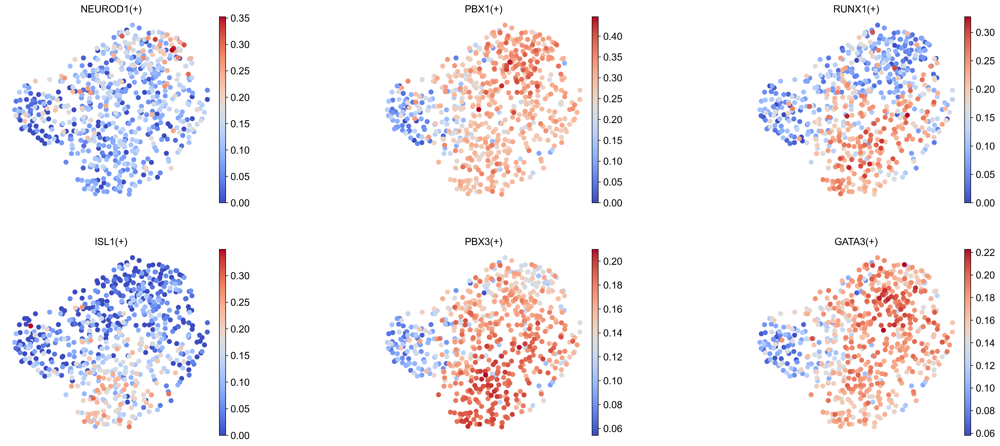

In [37]:
sc.set_figure_params(figsize=(5,5),frameon=False,dpi=150,dpi_save=600)
sc.pl.umap(adata_regulon_v2, 
           color=['NEUROD1(+)',
                  'PBX1(+)',
                  'RUNX1(+)',
                  'ISL1(+)',
                 
                 'PBX3(+)','GATA3(+)',
                 
                  ],  # 
           size=200, 
           wspace=0.6, 
           ncols=3, 
           color_map="coolwarm",  
           #save='_REGULON_SCTIVITY_HUMAN_SGN.pdf',
           
           )

In [32]:
import scvelo as scv

Text(0.5, 1.0, 'PBX1')

Text(0.5, 1.0, 'ISL1')

Text(0.5, 1.0, 'GATA3')

Text(0.5, 1.0, 'PRPH')

maxp pruned
LTSH dropped
cmap pruned
kern dropped
post pruned
PCLT dropped
JSTF dropped
meta dropped
DSIG dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 10 glyphs before
Glyph names: ['.notdef', 'eight', 'glyph00001', 'glyph00002', 'one', 'period', 'six', 'space', 'two', 'zero']
Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 25, 27]
Closed glyph list over 'GSUB': 20 glyphs after
Glyph names: ['.notdef', 'eight', 'glyph00001', 'glyph00002', 'glyph03674', 'glyph03675', 'glyph03676', 'glyph03680', 'glyph03682', 'one', 'period', 'six', 'space', 'two', 'uni00B2', 'uni00B9', 'uni2070', 'uni2076', 'uni2078', 'zero']
Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 25, 27, 239, 240, 3674, 3675, 3676, 3680, 3682, 3684, 3686, 3777]
Closing glyph list over 'glyf': 20 glyphs before
Glyph names: ['.notdef', 'eight', 'glyph00001', 'glyph00002', 'glyph03674', 'glyph03675', 'glyph03676', 'glyph03680', 'glyph03682', 'one', 'period'

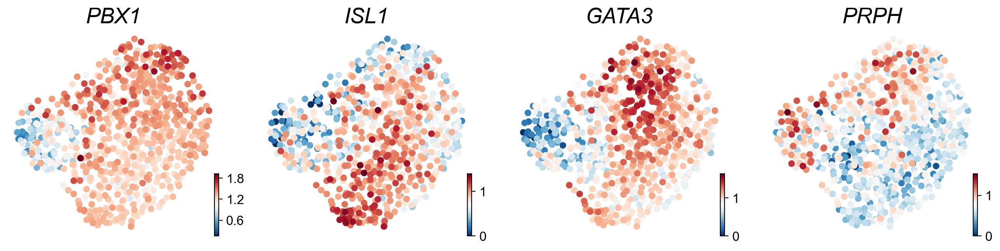

In [34]:
scv.set_figure_params(figsize=(4,3.5))
SGN=['PBX1','ISL1','GATA3','PRPH']
axs=scv.pl.umap(adata_sgn,color=SGN,smooth=True,show=False,size=150)
for ax in axs:
    ax.set_title(ax.get_title(),style="italic",fontsize=20)
plt.savefig(data_dir+"figures/figure4_S7/SGN_HUMAN_TFS-2.pdf",dpi=600)

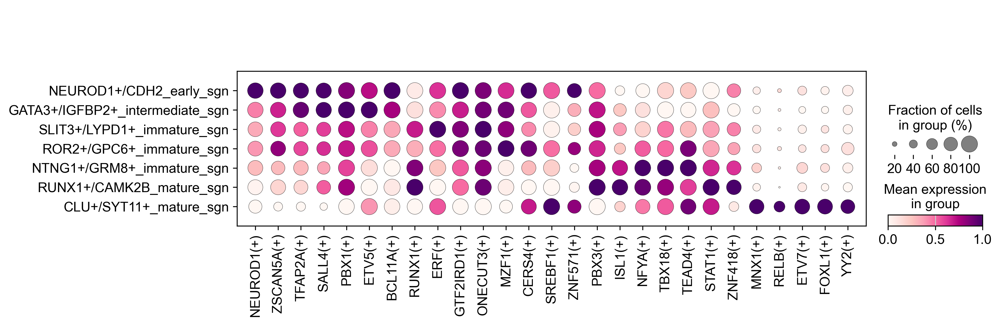

In [35]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.dotplot(adata_regulon_v2, var_names=['NEUROD1(+)','ZSCAN5A(+)','TFAP2A(+)',
                  'SALL4(+)','PBX1(+)','ETV5(+)','BCL11A(+)',
                  'RUNX1(+)','ERF(+)','GTF2IRD1(+)','ONECUT3(+)',
                     'MZF1(+)',
                  'CERS4(+)','SREBF1(+)','ZNF571(+)','PBX3(+)',                      
                  'ISL1(+)','NFYA(+)',
                  'TBX18(+)','TEAD4(+)','STAT1(+)','ZNF418(+)',
                  
                  'MNX1(+)','RELB(+)','ETV7(+)','FOXL1(+)','YY2(+)'
                                                     ],
              groupby='cell_type_final_v2', 
             standard_scale='var',
              cmap='RdPu',
              #dendrogram=True,
             )#standard_scale='var',swap_axes=True,

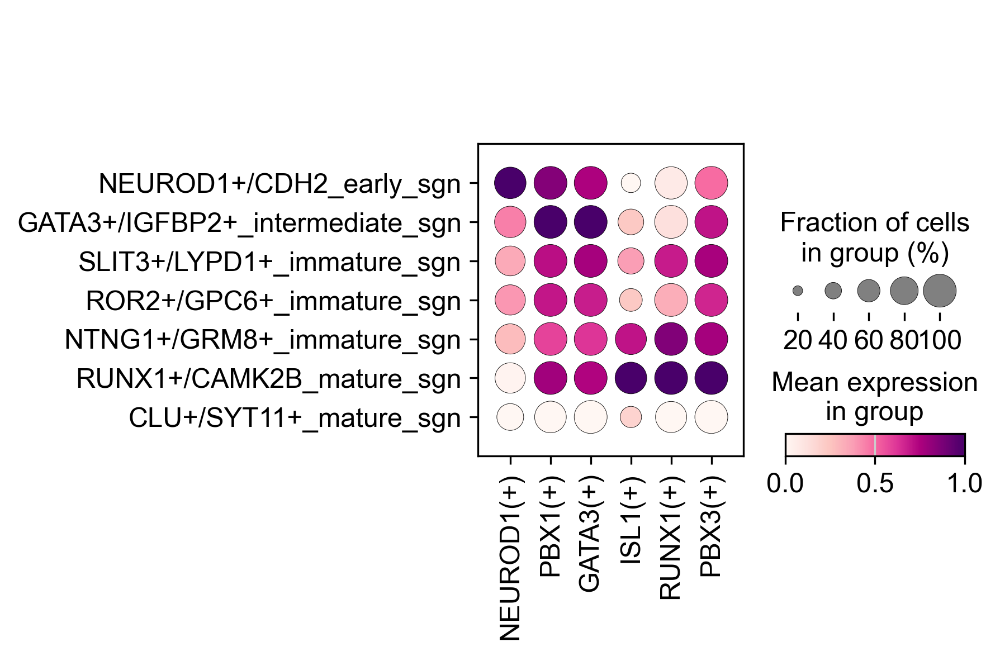

In [36]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.dotplot(adata_regulon_v2, var_names=['NEUROD1(+)','PBX1(+)','GATA3(+)',
                                           'ISL1(+)','RUNX1(+)','PBX3(+)',
                                                     ],
              groupby='cell_type_final_v2', 
             standard_scale='var',
              cmap='RdPu',
               #save='_REGULON_SCTIVITY_HUMAN_SGN.pdf',
              #dendrogram=True,
             )#standard_scale='var',swap_axes=True,

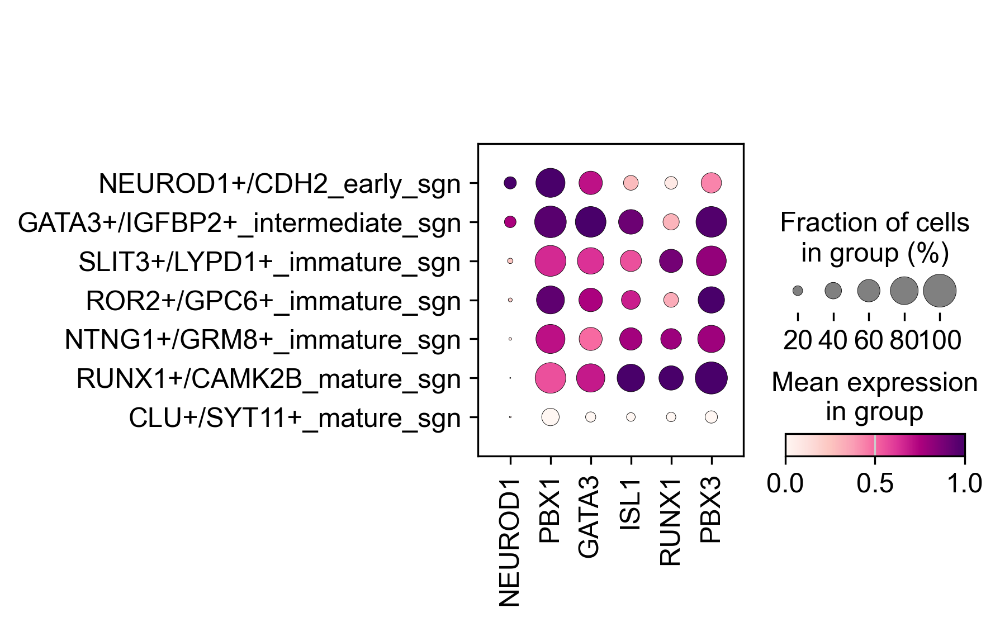

In [38]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
sc.pl.dotplot(downsampled_adata, var_names=['NEUROD1','PBX1',
                  'GATA3','ISL1','RUNX1','PBX3',
                  
                                                     ],
              groupby='cell_type_final_v2',
              #vmax=1.5,
             standard_scale='var',
              cmap='RdPu',
              #dendrogram=True,
               #save='_TF_HUMAN_SGN.pdf',
             )#standard_scale='var',swap_axes=True,